In [1]:
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import datetime

In [2]:
date_end = datetime.date.today()
delta_days = datetime.timedelta(days=31)
delta_amount_days = datetime.timedelta(days=3)

date_start = date_end - delta_days - delta_amount_days
date_end = date_end - delta_days


In [3]:
# Get all the information from curtailments
results = requests.get(f"http://144.39.204.242:11236/charger/T175-IT1-3420-016/profile?start={date_start}&end={date_end}&limit=20000")

In [4]:
# date_end = datetime.date.today()
# delta_days = datetime.timedelta(days=31)
# delta_amount_days = datetime.timedelta(days=3)

date_start = date_end - delta_days - delta_amount_days
date_end = date_end - delta_days
leviton_data = requests.get(f"http://144.39.204.242:11236/evr/leviton/evr?dateStart={date_start}&dateEnd={date_end}&limit=20000")
leviton_data = leviton_data.json()

In [5]:
power_data = []
timestamps_leviton = []
for i in leviton_data['data']:
    power_data.append(i['power'])
    timestamps_leviton.append(i['timestamp'])
print(len(power_data))
print(len(timestamps_leviton))

20000
20000


In [6]:
print(len(power_data))

20000


In [7]:
print(results.json())
data = results.json()['data']

{'data': [{'id': 2914406, 'chargingProfileId': 0, 'stackLevel': 0, 'chargingProfilePurpose': 'TxDefaultProfile', 'chargingProfileKind': 'Absolute', 'chargingSchedule': {'duration': 6000, 'startSchedule': '2023-04-15T05:59:53.963Z', 'chargingRateUnit': 'W', 'chargingSchedulePeriod': [{'startPeriod': 0, 'limit': 86609}]}, 'connectorId': 0, 'handled': True, 'cleared': False, 'accepted': True, 'manualControl': False, 'createdAt': '2023-04-15T05:59:53.963Z', 'updatedAt': '2023-04-15T05:59:58.956Z', 'ChargerId': 'T175-IT1-3420-016'}, {'id': 2914404, 'chargingProfileId': 0, 'stackLevel': 0, 'chargingProfilePurpose': 'TxDefaultProfile', 'chargingProfileKind': 'Absolute', 'chargingSchedule': {'duration': 6000, 'startSchedule': '2023-04-15T05:59:43.395Z', 'chargingRateUnit': 'W', 'chargingSchedulePeriod': [{'startPeriod': 0, 'limit': 86609}]}, 'connectorId': 0, 'handled': True, 'cleared': False, 'accepted': True, 'manualControl': False, 'createdAt': '2023-04-15T05:59:43.395Z', 'updatedAt': '2023

In [8]:
# data = pd.read_csv("Curtailments.csv")

In [12]:
curtailments = []
times = []
for i in data:
    curtailments.append(i["chargingSchedule"]["chargingSchedulePeriod"][0]["limit"] / 1000)
    times.append(i["chargingSchedule"]["startSchedule"])

print(len(curtailments))
print(times)
df = pd.DataFrame()
df["Curtailments (kW)"] = curtailments[10::1000]
df["Timestamp"] = times[:10:-1000]
df["Power Usage (kW)"] = power_data[:10:-1000]
df.to_csv("Curtailments.csv")

20000
['2023-04-15T05:59:53.963Z', '2023-04-15T05:59:43.395Z', '2023-04-15T05:59:32.714Z', '2023-04-15T05:59:22.016Z', '2023-04-15T05:59:11.458Z', '2023-04-15T05:59:00.851Z', '2023-04-15T05:58:49.770Z', '2023-04-15T05:58:39.184Z', '2023-04-15T05:58:28.167Z', '2023-04-15T05:58:17.310Z', '2023-04-15T05:58:06.357Z', '2023-04-15T05:57:55.327Z', '2023-04-15T05:57:44.301Z', '2023-04-15T05:57:33.835Z', '2023-04-15T05:57:23.068Z', '2023-04-15T05:57:12.540Z', '2023-04-15T05:57:01.609Z', '2023-04-15T05:56:51.115Z', '2023-04-15T05:56:40.632Z', '2023-04-15T05:56:29.420Z', '2023-04-15T05:56:17.786Z', '2023-04-15T05:56:05.504Z', '2023-04-15T05:55:54.949Z', '2023-04-15T05:55:43.874Z', '2023-04-15T05:55:33.421Z', '2023-04-15T05:55:22.170Z', '2023-04-15T05:55:11.297Z', '2023-04-15T05:54:58.553Z', '2023-04-15T05:54:47.998Z', '2023-04-15T05:54:37.401Z', '2023-04-15T05:54:26.777Z', '2023-04-15T05:54:16.028Z', '2023-04-15T05:54:04.833Z', '2023-04-15T05:53:54.294Z', '2023-04-15T05:53:43.504Z', '2023-04-15T0

C:\Users\sonor\AppData\Local\Temp\ipykernel_29504\3144289086.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(list(df['Timestamp'].apply(lambda time : (datetime.datetime.strptime(time, "%Y-%m-%dT%H:%M:%S.%fZ") - datetime.timedelta(hours=12)).strftime('%H:%M') )), rotation=60, fontsize=12)


Text(0.5, 1.0, 'Curtailments and Power Usage at the EVR')

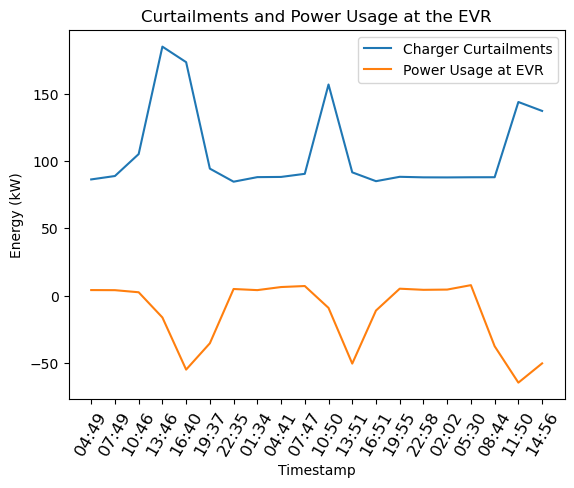

In [17]:
ax = sns.lineplot(x="Timestamp", y="Curtailments (kW)", data=df, label="Charger Curtailments")
sns.lineplot(x="Timestamp", y="Power Usage (kW)", data=df, label="Power Usage at EVR")
ax.set_xticklabels(list(df['Timestamp'].apply(lambda time : (datetime.datetime.strptime(time, "%Y-%m-%dT%H:%M:%S.%fZ") - datetime.timedelta(hours=12)).strftime('%H:%M') )), rotation=60, fontsize=12)
plt.ylabel("Energy (kW)")
plt.title("Curtailments and Power Usage at the EVR")